## Introduction

### Problem Statement:
Given data about COVID-19 patients, write code to visualize the impact and analyze the trend of rate of infection and recovery as well as make predictions about the number of cases expected a week in future based on the current trends.

### Dataset:
CSV and Excel files containing data about the number of COVID-19 confirmed deaths and recovered patients both around the world and in India. Download Link

### Guidelines:
 - Usepandas to accumulate data from multiple data files.
 - Useplotly (visualization library) to create interactive visualizations.
 - UseFacebook prophet library to make time series models.
 - Visualize the prediction by combining these technologies.

### Source

Original Data source

https://github.com/CSSEGISandData/COVID-19

### Data Sources

1. Johns Hopkins University CSSE COVID-19 Dataset  
   Source: https://github.com/CSSEGISandData/COVID-19  
   License: CC BY 4.0

2. Pre-cleaned dataset provided by Intellipaat as `covid_19_clean_complete.csv`.  
   Original cleaning reference appears to be based on scripts from:  
   https://github.com/imdevskp/covid_19_jhu_data_web_scrap_and_cleaning  
   License: Not specified (no LICENSE file). Used only for educational purposes.

All datasets and code are used strictly for academic and non-commercial learning.


This dataset is a cleaned and combined derivative of the COVID-19 global data
maintained by the Johns Hopkins University Center for Systems Science and Engineering (JHU CSSE).

Original Source (CC BY 4.0):
https://github.com/CSSEGISandData/COVID-19

A cleaned version of this dataset (`covid_19_clean_complete.csv`) was provided as part of an
educational assignment by Intellipaat. The dataset is further processed and transformed in
this project for analysis and visualization purposes.


Additional reference for the cleaning methodology:
https://github.com/imdevskp/covid_19_jhu_data_web_scrap_and_cleaning
(License not specified; referenced only for educational purposes.)


The original COVID-19 dataset by Johns Hopkins University CSSE is licensed under
Creative Commons Attribution 4.0 International (CC BY 4.0).

License Summary: https://creativecommons.org/licenses/by/4.0/
Full License Text: https://creativecommons.org/licenses/by/4.0/legalcode


**https://www.kaggle.com/datasets/imdevskp/corona-virus-report**

## Data Loadign and cleaning

**Input covid_19_cleaned.csv is from Covid_19_data_cleaning.ipynb**

**Other files are from Covid_19_Data_Extraction.ipynb**

### Import Libraries

In [1]:
import pandas as pd
import numpy as np

pd.set_option("display.max_columns", 50)
pd.set_option("display.max_rows", 200)

### Load the cleaned dataset

In [2]:
# Load the dataset is cleaned earlier
cleaned_df = pd.read_csv("/content/covid_19_cleaned.csv")
print(cleaned_df.shape)
cleaned_df.head()

(49068, 10)


,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,Afghanistan,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,Albania,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,Algeria,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,Andorra,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,Angola,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


In [3]:
full_grouped = pd.read_csv("/content/full_grouped.csv")
print(full_grouped.shape)
full_grouped.head()

(35156, 12)


,Date,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region
0,2020-01-22,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,Eastern Mediterranean
1,2020-01-22,Albania,41.15330,20.168300,0,0,0,0,0,0,0,Europe
2,2020-01-22,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,Africa
3,2020-01-22,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,Europe
4,2020-01-22,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,Africa


In [4]:
country_wise_latest = pd.read_csv("/content/country_wise_latest.csv")
print(country_wise_latest.shape)
country_wise_latest.head()

(187, 17)


,Country/Region,Lat,Long,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,33.93911,67.709953,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,41.15330,20.168300,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,28.03390,1.659600,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,42.50630,1.521800,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,-11.20270,17.873900,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [5]:
day_wise = pd.read_csv("/content/day_wise.csv")
print(day_wise.shape)
day_wise.head()

(188, 12)


,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


### Basic Dataset Information

In [6]:
print("Shape of dataset:", cleaned_df.shape)
print("\nColumns:\n", cleaned_df.columns.tolist())

cleaned_df.info()

Shape of dataset: (49068, 10)

Columns:
 ['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'WHO Region']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  49068 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [7]:
print("Shape of dataset:", full_grouped.shape)
print("\nColumns:\n", full_grouped.columns.tolist())

full_grouped.info()

Shape of dataset: (35156, 12)

Columns:
 ['Date', 'Country/Region', 'Lat', 'Long', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'New cases', 'New deaths', 'New recovered', 'WHO Region']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            35156 non-null  object 
 1   Country/Region  35156 non-null  object 
 2   Lat             35156 non-null  float64
 3   Long            35156 non-null  float64
 4   Confirmed       35156 non-null  int64  
 5   Deaths          35156 non-null  int64  
 6   Recovered       35156 non-null  int64  
 7   Active          35156 non-null  int64  
 8   New cases       35156 non-null  int64  
 9   New deaths      35156 non-null  int64  
 10  New recovered   35156 non-null  int64  
 11  WHO Region      35156 non-null  object 
dtypes: float64(2), int64(7), object(3)
memory usage: 3.2+ MB


In [8]:
print("Shape of dataset:", country_wise_latest.shape)
print("\nColumns:\n", country_wise_latest.columns.tolist())

country_wise_latest.info()

Shape of dataset: (187, 17)

Columns:
 ['Country/Region', 'Lat', 'Long', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'New cases', 'New deaths', 'New recovered', 'Deaths / 100 Cases', 'Recovered / 100 Cases', 'Deaths / 100 Recovered', 'Confirmed last week', '1 week change', '1 week % increase', 'WHO Region']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Lat                     187 non-null    float64
 2   Long                    187 non-null    float64
 3   Confirmed               187 non-null    int64  
 4   Deaths                  187 non-null    int64  
 5   Recovered               187 non-null    int64  
 6   Active                  187 non-null    int64  
 7   New cases               187 non-null    int64  
 8   New deaths              187 non-null    int64  
 

In [9]:
print("Shape of dataset:", day_wise.shape)
print("\nColumns:\n", day_wise.columns.tolist())

day_wise.info()

Shape of dataset: (188, 12)

Columns:
 ['Date', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'New cases', 'New deaths', 'New recovered', 'Deaths / 100 Cases', 'Recovered / 100 Cases', 'Deaths / 100 Recovered', 'No. of countries']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    188 non-null    object 
 1   Confirmed               188 non-null    int64  
 2   Deaths                  188 non-null    int64  
 3   Recovered               188 non-null    int64  
 4   Active                  188 non-null    int64  
 5   New cases               188 non-null    int64  
 6   New deaths              188 non-null    int64  
 7   New recovered           188 non-null    int64  
 8   Deaths / 100 Cases      188 non-null    float64
 9   Recovered / 100 Cases   188 non-null    float64
 10  Deaths / 100 Recovered 

### Check Missing Values and duplicates

In [10]:
cleaned_df.isnull().sum()

,0
Province/State,0
Country/Region,0
Lat,0
Long,0
Date,0
Confirmed,0
Deaths,0
Recovered,0
Active,0
WHO Region,0


In [11]:
cleaned_df.isnull().sum().sum()

np.int64(0)

In [12]:
cleaned_df.duplicated().sum()

np.int64(0)

In [13]:
full_grouped.isnull().sum()

,0
Date,0
Country/Region,0
Lat,0
Long,0
Confirmed,0
Deaths,0
Recovered,0
Active,0
New cases,0
New deaths,0


In [14]:
full_grouped.isnull().sum().sum()

np.int64(0)

In [15]:
full_grouped.duplicated().sum()

np.int64(0)

In [16]:
country_wise_latest.isnull().sum()

,0
Country/Region,0
Lat,0
Long,0
Confirmed,0
Deaths,0
Recovered,0
Active,0
New cases,0
New deaths,0
New recovered,0


In [17]:
country_wise_latest.isnull().sum().sum()

np.int64(0)

In [18]:
country_wise_latest.duplicated().sum()

np.int64(0)

In [19]:
day_wise.isnull().sum()

,0
Date,0
Confirmed,0
Deaths,0
Recovered,0
Active,0
New cases,0
New deaths,0
New recovered,0
Deaths / 100 Cases,0
Recovered / 100 Cases,0


In [20]:
day_wise.isnull().sum().sum()

np.int64(0)

In [21]:
day_wise.duplicated().sum()

np.int64(0)

###Convert Date Column to datetime

while we saved it as csv, the datetime may be stored as object and read as object

In [22]:
cleaned_df['Date'] = pd.to_datetime(cleaned_df['Date'])

cleaned_df[['Date']].head()

,Date
0,2020-01-22
1,2020-01-22
2,2020-01-22
3,2020-01-22
4,2020-01-22


In [23]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  49068 non-null  object        
 1   Country/Region  49068 non-null  object        
 2   Lat             49068 non-null  float64       
 3   Long            49068 non-null  float64       
 4   Date            49068 non-null  datetime64[ns]
 5   Confirmed       49068 non-null  int64         
 6   Deaths          49068 non-null  int64         
 7   Recovered       49068 non-null  int64         
 8   Active          49068 non-null  int64         
 9   WHO Region      49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB


In [24]:
full_grouped['Date'] = pd.to_datetime(full_grouped['Date'])

print(full_grouped[['Date']].head())

full_grouped.info()

        Date
0 2020-01-22
1 2020-01-22
2 2020-01-22
3 2020-01-22
4 2020-01-22
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            35156 non-null  datetime64[ns]
 1   Country/Region  35156 non-null  object        
 2   Lat             35156 non-null  float64       
 3   Long            35156 non-null  float64       
 4   Confirmed       35156 non-null  int64         
 5   Deaths          35156 non-null  int64         
 6   Recovered       35156 non-null  int64         
 7   Active          35156 non-null  int64         
 8   New cases       35156 non-null  int64         
 9   New deaths      35156 non-null  int64         
 10  New recovered   35156 non-null  int64         
 11  WHO Region      35156 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(7), object(2)
memory usage: 3.2+ MB


In [25]:
country_wise_latest.info() # No date

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Lat                     187 non-null    float64
 2   Long                    187 non-null    float64
 3   Confirmed               187 non-null    int64  
 4   Deaths                  187 non-null    int64  
 5   Recovered               187 non-null    int64  
 6   Active                  187 non-null    int64  
 7   New cases               187 non-null    int64  
 8   New deaths              187 non-null    int64  
 9   New recovered           187 non-null    int64  
 10  Deaths / 100 Cases      187 non-null    float64
 11  Recovered / 100 Cases   187 non-null    float64
 12  Deaths / 100 Recovered  187 non-null    float64
 13  Confirmed last week     187 non-null    int64  
 14  1 week change           187 non-null    in

In [26]:
day_wise['Date'] = pd.to_datetime(day_wise['Date'])

print(day_wise[['Date']].head())

day_wise.info()

        Date
0 2020-01-22
1 2020-01-23
2 2020-01-24
3 2020-01-25
4 2020-01-26
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-

### Overall Date Range

In [27]:
print("Min Date:", cleaned_df['Date'].min())
print("Max Date:", cleaned_df['Date'].max())
print("Total days:", (cleaned_df['Date'].max() - cleaned_df['Date'].min()).days + 1) # for including the end date

Min Date: 2020-01-22 00:00:00
Max Date: 2020-07-27 00:00:00
Total days: 188


In [28]:
overall_minimum_date = cleaned_df['Date'].min().date()
overall_maximum_date = cleaned_df['Date'].max().date()

In [29]:
overall_date_range = (cleaned_df['Date'].max() - cleaned_df['Date'].min()).days + 1

### Number of Countries

In [30]:
countries = cleaned_df['Country/Region'].unique()
print("Number of Countries:", len(countries))

countries[:20]  # preview first 20

Number of Countries: 187


array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Benin', 'Bhutan', 'Bolivia'],
      dtype=object)

In [31]:
number_of_countries = len(countries)

In [32]:
np.equal(countries.sort(), np.array(country_wise_latest['Country/Region']).sort()).all()

np.True_

In [33]:
np.array_equal(countries, np.array(country_wise_latest['Country/Region']))

True

### Date Range per Country

"agg" means aggregate.

For each country, it calculates:

min → earliest date (first appearance of COVID data)

max → latest date (last available date for that country)

.reset_index()

Converts the grouped index (country names) back into a normal column.

Now the table becomes a normal dataframe.

.rename(columns={'min':'Start Date','max':'End Date'})

Gives meaningful names to min/max:

min → Start Date

max → End Date

In [34]:
country_province_date_range = (
    cleaned_df.groupby(["Country/Region", "Province/State"])["Date"]
      .agg(['min','max'])
      .reset_index()
      .rename(columns={'min':'Start Date','max':'End Date'})
)

country_province_date_range.head(10)


,Country/Region,Province/State,Start Date,End Date
0,Afghanistan,Afghanistan,2020-01-22,2020-07-27
1,Albania,Albania,2020-01-22,2020-07-27
2,Algeria,Algeria,2020-01-22,2020-07-27
3,Andorra,Andorra,2020-01-22,2020-07-27
4,Angola,Angola,2020-01-22,2020-07-27
5,Antigua and Barbuda,Antigua and Barbuda,2020-01-22,2020-07-27
6,Argentina,Argentina,2020-01-22,2020-07-27
7,Armenia,Armenia,2020-01-22,2020-07-27
8,Australia,Australian Capital Territory,2020-01-22,2020-07-27
9,Australia,New South Wales,2020-01-22,2020-07-27


In [35]:
country_province_date_range.sort_values("Start Date").head(10)

,Country/Region,Province/State,Start Date,End Date
0,Afghanistan,Afghanistan,2020-01-22,2020-07-27
165,Malawi,Malawi,2020-01-22,2020-07-27
166,Malaysia,Malaysia,2020-01-22,2020-07-27
167,Maldives,Maldives,2020-01-22,2020-07-27
168,Mali,Mali,2020-01-22,2020-07-27
169,Malta,Malta,2020-01-22,2020-07-27
170,Mauritania,Mauritania,2020-01-22,2020-07-27
171,Mauritius,Mauritius,2020-01-22,2020-07-27
172,Mexico,Mexico,2020-01-22,2020-07-27
173,Moldova,Moldova,2020-01-22,2020-07-27


In [36]:
country_province_date_range.sort_values(["Country/Region", "Province/State"])

,Country/Region,Province/State,Start Date,End Date
0,Afghanistan,Afghanistan,2020-01-22,2020-07-27
1,Albania,Albania,2020-01-22,2020-07-27
2,Algeria,Algeria,2020-01-22,2020-07-27
3,Andorra,Andorra,2020-01-22,2020-07-27
4,Angola,Angola,2020-01-22,2020-07-27
...,...,...,...,...
256,West Bank and Gaza,West Bank and Gaza,2020-01-22,2020-07-27
257,Western Sahara,Western Sahara,2020-01-22,2020-07-27
258,Yemen,Yemen,2020-01-22,2020-07-27
259,Zambia,Zambia,2020-01-22,2020-07-27


In [37]:
country_province_date_range['Date Range'] = country_province_date_range['End Date'] - country_province_date_range['Start Date'] + pd.Timedelta(days=1)

In [38]:
date_condition = (
    (country_province_date_range['Start Date'].dt.date == overall_minimum_date) &
    (country_province_date_range['End Date'].dt.date == overall_maximum_date) &
    (country_province_date_range['Date Range'].dt.days == overall_date_range)
)

In [39]:
date_condition

,0
0,True
1,True
2,True
3,True
4,True
...,...
256,True
257,True
258,True
259,True


In [40]:
country_province_date_range[date_condition]

,Country/Region,Province/State,Start Date,End Date,Date Range
0,Afghanistan,Afghanistan,2020-01-22,2020-07-27,188 days
1,Albania,Albania,2020-01-22,2020-07-27,188 days
2,Algeria,Algeria,2020-01-22,2020-07-27,188 days
3,Andorra,Andorra,2020-01-22,2020-07-27,188 days
4,Angola,Angola,2020-01-22,2020-07-27,188 days
...,...,...,...,...,...
256,West Bank and Gaza,West Bank and Gaza,2020-01-22,2020-07-27,188 days
257,Western Sahara,Western Sahara,2020-01-22,2020-07-27,188 days
258,Yemen,Yemen,2020-01-22,2020-07-27,188 days
259,Zambia,Zambia,2020-01-22,2020-07-27,188 days


In [41]:
len(country_province_date_range[date_condition]) == len(cleaned_df[['Country/Region', 'Province/State']].drop_duplicates())

True

In [42]:
date_condition.all()

np.True_

In [43]:
date_condition.sum() == len(cleaned_df[['Country/Region', 'Province/State']].drop_duplicates())

np.True_

From the above we can see all countries satisfies our date range check

In [44]:
full_grouped_date_range = (
    cleaned_df.groupby("Country/Region")["Date"]
      .agg(['min','max'])
      .reset_index()
      .rename(columns={'min':'Start Date','max':'End Date'})
)

full_grouped_date_range.head(10)


,Country/Region,Start Date,End Date
0,Afghanistan,2020-01-22,2020-07-27
1,Albania,2020-01-22,2020-07-27
2,Algeria,2020-01-22,2020-07-27
3,Andorra,2020-01-22,2020-07-27
4,Angola,2020-01-22,2020-07-27
5,Antigua and Barbuda,2020-01-22,2020-07-27
6,Argentina,2020-01-22,2020-07-27
7,Armenia,2020-01-22,2020-07-27
8,Australia,2020-01-22,2020-07-27
9,Austria,2020-01-22,2020-07-27


In [45]:
full_grouped_date_range['Date Range'] = full_grouped_date_range['End Date'] - full_grouped_date_range['Start Date'] + pd.Timedelta(days=1)

In [46]:
full_grouped_date_condition = (
    (full_grouped_date_range['Start Date'].dt.date == overall_minimum_date) &
    (full_grouped_date_range['End Date'].dt.date == overall_maximum_date) &
    (full_grouped_date_range['Date Range'].dt.days == overall_date_range)
)

In [47]:
len(full_grouped_date_range[date_condition]) == full_grouped['Country/Region'].nunique()

/tmp/ipython-input-917378876.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  len(full_grouped_date_range[date_condition]) == full_grouped['Country/Region'].nunique()


True

In [48]:
full_grouped_date_condition.all()

np.True_

In [49]:
full_grouped_date_condition.sum() == full_grouped['Country/Region'].nunique()

np.True_

Country wise latest has no date column

In [50]:
day_wise['Date'].min() == day_wise['Date'][0]

True

In [51]:
day_wise['Date'].max() == day_wise['Date'][len(day_wise)-1]

True

In [52]:
day_wise['Date'][0]

Timestamp('2020-01-22 00:00:00')

In [53]:
day_wise['Date'][0].date() == overall_minimum_date

True

In [54]:
day_wise['Date'][len(day_wise)-1].date() == overall_maximum_date

True

In [55]:
(day_wise['Date'].max() - day_wise['Date'].min()).days + 1

188

In [56]:
overall_date_range

188

In [57]:
(day_wise['Date'].max() - day_wise['Date'].min()).days + 1 == overall_date_range

True

In [58]:
len(day_wise) == overall_date_range

True

### Summary Statistics

In [59]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  49068 non-null  object        
 1   Country/Region  49068 non-null  object        
 2   Lat             49068 non-null  float64       
 3   Long            49068 non-null  float64       
 4   Date            49068 non-null  datetime64[ns]
 5   Confirmed       49068 non-null  int64         
 6   Deaths          49068 non-null  int64         
 7   Recovered       49068 non-null  int64         
 8   Active          49068 non-null  int64         
 9   WHO Region      49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB


In [60]:
cleaned_df.describe()

,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,49068,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,2020-04-24 12:00:00,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
min,-51.796300,-135.000000,2020-01-22 00:00:00,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,2020-03-08 18:00:00,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,2020-04-24 12:00:00,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,2020-06-10 06:00:00,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,2020-07-27 00:00:00,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06
std,24.950320,70.442740,NaN,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04


In [61]:
full_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            35156 non-null  datetime64[ns]
 1   Country/Region  35156 non-null  object        
 2   Lat             35156 non-null  float64       
 3   Long            35156 non-null  float64       
 4   Confirmed       35156 non-null  int64         
 5   Deaths          35156 non-null  int64         
 6   Recovered       35156 non-null  int64         
 7   Active          35156 non-null  int64         
 8   New cases       35156 non-null  int64         
 9   New deaths      35156 non-null  int64         
 10  New recovered   35156 non-null  int64         
 11  WHO Region      35156 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(7), object(2)
memory usage: 3.2+ MB


In [62]:
full_grouped.describe()

,Date,Lat,Long,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
count,35156,35156.000000,35156.000000,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04,35156.00000,35156.000000,35156.000000
mean,2020-04-24 12:00:00,20.413597,17.193784,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04,469.36375,18.668051,270.482620
min,2020-01-22 00:00:00,-40.900600,-102.552800,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00,0.00000,0.000000,0.000000
25%,2020-03-08 18:00:00,5.152149,-8.224500,1.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000
50%,2020-04-24 12:00:00,18.971200,19.503300,2.500000e+02,4.000000,3.300000e+01,8.500000e+01,2.00000,0.000000,0.000000
75%,2020-06-10 06:00:00,41.204380,45.038200,3.640250e+03,78.250000,1.286250e+03,1.454000e+03,75.00000,1.000000,20.000000
max,2020-07-27 00:00:00,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,77255.00000,3887.000000,140050.000000
std,NaN,24.019485,57.259217,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04,3005.86754,115.236717,2064.310734


In [63]:
country_wise_latest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Lat                     187 non-null    float64
 2   Long                    187 non-null    float64
 3   Confirmed               187 non-null    int64  
 4   Deaths                  187 non-null    int64  
 5   Recovered               187 non-null    int64  
 6   Active                  187 non-null    int64  
 7   New cases               187 non-null    int64  
 8   New deaths              187 non-null    int64  
 9   New recovered           187 non-null    int64  
 10  Deaths / 100 Cases      187 non-null    float64
 11  Recovered / 100 Cases   187 non-null    float64
 12  Deaths / 100 Recovered  187 non-null    float64
 13  Confirmed last week     187 non-null    int64  
 14  1 week change           187 non-null    in

In [64]:
country_wise_latest.describe()

,Lat,Long,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,187.000000,187.000000,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,20.413597,17.193784,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,24.083624,57.412116,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,-40.900600,-102.552800,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,5.787974,-7.958300,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,18.971200,19.503300,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,41.178840,44.358745,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


In [65]:
day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory 

In [66]:
day_wise.describe()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
count,188,1.880000e+02,188.000000,1.880000e+02,1.880000e+02,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,2020-04-24 12:00:00,4.406960e+06,230770.760638,2.066001e+06,2.110188e+06,87771.021277,3490.925532,50580.250000,4.860638,34.343936,22.104521,144.351064
min,2020-01-22 00:00:00,5.550000e+02,17.000000,2.800000e+01,5.100000e+02,0.000000,0.000000,0.000000,2.040000,1.710000,6.260000,6.000000
25%,2020-03-08 18:00:00,1.121910e+05,3935.000000,6.044125e+04,5.864175e+04,5568.500000,250.750000,2488.250000,3.510000,22.785000,9.650000,101.250000
50%,2020-04-24 12:00:00,2.848733e+06,204190.000000,7.847840e+05,1.859759e+06,81114.000000,4116.000000,30991.500000,4.850000,35.680000,15.380000,184.000000
75%,2020-06-10 06:00:00,7.422046e+06,418634.500000,3.416396e+06,3.587015e+06,131502.500000,5346.000000,79706.250000,6.297500,48.945000,25.342500,187.000000
max,2020-07-27 00:00:00,1.648048e+07,654036.000000,9.468087e+06,6.358362e+06,282756.000000,9966.000000,284394.000000,7.180000,57.450000,134.430000,187.000000
std,NaN,4.757988e+06,217929.094183,2.627976e+06,1.969670e+06,75295.293255,2533.360826,56356.846292,1.579541,16.206159,22.568307,65.175979


## Visualizations

In [67]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [68]:
import warnings
warnings.filterwarnings("ignore")

### Simple bubble plot correlation

In [69]:
def plot_bubble_cases(country_wise_latest,
                      x='Confirmed',
                      y='Deaths',
                      size='Active',
                      color='WHO Region',
                      title='COVID-19 Bubble Chart'):

    fig = px.scatter(
        country_wise_latest,
        x=x,
        y=y,
        size=size,
        color=color,
        hover_name='Country/Region',
        size_max=60,
        log_x=True,
        log_y=True,
        title=f"{title} : {x} vs {y}"
    )

    fig.update_layout(
        xaxis_title=x,
        yaxis_title=y
    )

    fig.show()


In [70]:
plot_bubble_cases(country_wise_latest)

In [71]:
plot_bubble_cases(country_wise_latest, size='Recovered')

### World Bubble Map

In [72]:
from numpy._core.multiarray import promote_types
def plot_world_bubble_map(df,
                          size_col='Confirmed',
                          color_col='WHO Region',
                          projection_type=None,
                          animation_frame=None,
                          title='COVID-19 World Bubble Map'):

    fig = px.scatter_geo(
        df,
        lat='Lat',
        lon='Long',
        size=size_col,
        color=color_col,
        hover_name='Country/Region',
        animation_frame=animation_frame,
        size_max=50,
        projection=projection_type,
        title=title
    )

    fig.update_layout(
        geo=dict(
            showcountries=True,
            showcoastlines=True
        )
    )

    fig.show()


In [73]:
plot_world_bubble_map(country_wise_latest)

In [74]:
projection_types = ['azimuthal equal area', 'natural earth', 'mercator', 'orthographic']

In [75]:
plot_world_bubble_map(country_wise_latest, size_col='Active', projection_type=projection_types[1])

In [76]:
country_wise_latest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Lat                     187 non-null    float64
 2   Long                    187 non-null    float64
 3   Confirmed               187 non-null    int64  
 4   Deaths                  187 non-null    int64  
 5   Recovered               187 non-null    int64  
 6   Active                  187 non-null    int64  
 7   New cases               187 non-null    int64  
 8   New deaths              187 non-null    int64  
 9   New recovered           187 non-null    int64  
 10  Deaths / 100 Cases      187 non-null    float64
 11  Recovered / 100 Cases   187 non-null    float64
 12  Deaths / 100 Recovered  187 non-null    float64
 13  Confirmed last week     187 non-null    int64  
 14  1 week change           187 non-null    in

In [77]:
plot_world_bubble_map(country_wise_latest, size_col='Deaths / 100 Cases', projection_type=projection_types[2])

In [78]:
plot_world_bubble_map(country_wise_latest, size_col='Recovered / 100 Cases', projection_type=projection_types[3])

In [79]:
plot_world_bubble_map(country_wise_latest, size_col='Deaths', projection_type=projection_types[0])

### Animated Bubble maps

In [80]:
plot_world_bubble_map(full_grouped, animation_frame='Date', title='COVID-19 Spread Over Time (Animated Bubble Map)')

In [81]:
plot_world_bubble_map(
    full_grouped,
    size_col='New cases',
    animation_frame='Date',
    projection_type=projection_types[1],
    title='COVID-19 New Cases Over Time (Animated Bubble Map)'
    )

In [82]:
# cleaned_df will plot multiple provinces under same country name

plot_world_bubble_map(cleaned_df, animation_frame='Date', title='COVID-19 Spread Over Time (Animated Bubble Map)')

### Trend plot

In [83]:
def plot_trend(df, metrics=['Confirmed', 'Deaths', 'Recovered', 'Active'], title="Trend"):
    fig = px.line(
        df,
        x='Date',
        y=metrics,
        title=title,
        labels={'value': 'Number of Cases', 'variable': 'Case Type'}
    )

    fig.update_layout(
        xaxis_title="Date",
        yaxis_title="Daily Count",
        legend_title="Category"
    )
    fig.show()

In [84]:
plot_trend(
    day_wise,
    metrics=['Confirmed', 'Deaths', 'Recovered', 'Active'],
    title='Global COVID-19 Trend Over Time'
)

In [85]:
plot_trend(cleaned_df[cleaned_df['Country/Region']=='India'],
                  title="India COVID-19 Trend Over Time")

In [86]:
def plot_country_trend(full_grouped, countries, metrics=['Confirmed']):
    if isinstance(countries, str):
        countries = [countries]

    df = full_grouped[full_grouped['Country/Region'].isin(countries)]

    fig = px.line(
        df,
        x='Date',
        y=metrics,
        color='Country/Region',
        title="Country-wise COVID Trend"
    )
    fig.show()

In [87]:
plot_country_trend(full_grouped, countries=['India', 'US', 'Brazil'])

In [88]:
plot_country_trend(full_grouped, countries=['India', 'US', 'Brazil'], metrics=['New cases'])

In [89]:
plot_country_trend(full_grouped, countries=['India', 'US'], metrics=['New deaths'])

In [90]:
plot_country_trend(full_grouped, countries=['India', 'United Kingdom'], metrics=['Confirmed', 'Active'])

### Bar charts for top countries

In [91]:
def plot_top_countries(country_wise_latest, n=10, metric='Confirmed'):
    """
    Plot top N countries by a chosen metric.
    """
    top = country_wise_latest.nlargest(n, metric)

    fig = px.bar(
        top,
        x='Country/Region',
        y=metric,
        color=metric,
        title=f"Top {n} Countries by {metric}",
        text=metric
    )

    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()


color = metric

Example:

If metric = "Confirmed"

Countries with higher confirmed cases get darker/brighter colors

Countries with lower values get lighter colors


fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')

This line controls text labels displayed on top of each bar.

✔ What .update_traces() does

It updates all bar traces in the figure.

A) texttemplate='%{text:.2s}'

It formats the text shown above the bars

.2s = 2 significant digits

Example:

1,230,000 → "1.2M"

450,000 → "4.5e5"

12,345 → "1.2e4"

This makes labels short and readable instead of huge numbers.

If you want exact numbers, use:


textposition='outside'

Places the text outside the bar, above it

Looks better for comparison

Makes the bar itself easier to read


–45° angle = diagonal text (rotates text)

This makes labels neat and readable.

Could also use:

xaxis_tickangle=-90 (vertical)

xaxis_tickangle=0 (horizontal)

In [92]:
plot_top_countries(country_wise_latest, n=10) # metric is Confirmed

In [93]:
plot_top_countries(country_wise_latest, n=10, metric='Deaths')
plot_top_countries(country_wise_latest, n=10, metric='Recovered')
plot_top_countries(country_wise_latest, n=10, metric='Active')

In [94]:
def plot_stacked_recovered_deaths_active(country_wise_latest, n=10,
                                  title="Recovered vs Deaths vs Active Cases (Stacked Bar Chart)"):

    # Top N countries by confirmed cases
    top = country_wise_latest.nlargest(n, 'Confirmed')

    # Reduce to necessary columns
    df = top[['Country/Region', 'Recovered', 'Deaths', 'Active']]

    fig = px.bar(
        df,
        x='Country/Region',
        y=['Recovered', 'Deaths', 'Active'],
        title=title,
        labels={'value': 'Number of Cases', 'variable': 'Case Type'},
    )

    fig.update_layout(barmode='stack',
                      xaxis_title="Country",
                      yaxis_title="Cases",
                      legend_title="Metric",
                      xaxis_tickangle=-45)

    fig.show()


In [95]:
plot_stacked_recovered_deaths_active(country_wise_latest)

In [96]:
def plot_grouped_confirmed_active(country_wise_latest, n=10,
                                 title="Confirmed vs Active Cases (Grouped Bar Chart)"):
    # Top N countries by confirmed cases
    top = country_wise_latest.nlargest(n, 'Confirmed')

    # Reduce to necessary columns
    df = top[['Country/Region', 'Confirmed', 'Active']]

    fig = px.bar(
        df,
        x='Country/Region',
        y=['Confirmed', 'Active'],
        title=title,
        labels={'value': 'Number of Cases', 'variable': 'Case Type'},
        barmode='group'  # group bars side by side
    )

    fig.update_layout(xaxis_title="Country",
                      yaxis_title="Cases",
                      legend_title="Metric",
                      xaxis_tickangle=-45)

    fig.show()


In [97]:
plot_grouped_confirmed_active(country_wise_latest)

In [98]:
def plot_top_countries_horizontal(country_wise_latest, n=10, metric='Confirmed'):
    top = country_wise_latest.nlargest(n, metric)

    fig = px.bar(
        top,
        y='Country/Region',
        x=metric,
        color=metric,
        orientation='h',  # for horizontal bar chart
        title=f"Top {n} Countries by {metric}"
    )
    fig.update_layout(yaxis={'categoryorder':'total ascending'})
    fig.show()

In [99]:
plot_top_countries_horizontal(country_wise_latest, metric='Deaths')

**Explanation of `fig.update_layout(yaxis={'categoryorder':'total ascending'})`**

This line of code is used in Plotly to control the ordering of categories on the y-axis of a horizontal bar chart.

*   **`fig.update_layout()`**: This function allows you to modify the layout properties of the plot.
*   **`yaxis`**: This specifies that the modification applies to the y-axis.
*   **`'categoryorder':'total ascending'`**: This is the key part:
    *   `'categoryorder'` tells Plotly how to sort the categorical items on this axis.
    *   `'total ascending'` means the categories will be sorted based on their associated numerical values (e.g., 'Confirmed', 'Deaths') in ascending order. In a horizontal bar chart, this results in the smallest values appearing at the bottom of the y-axis and the largest values appearing at the top of the y-axis.


'Ascending' in this context means that as you move up the y-axis, the values of the categories increase.

In [100]:
def plot_animated_bar_race(full_grouped,
                           metric='Confirmed',
                           n=10,
                           title='COVID-19 Top Countries Over Time (Animated Bar Race)'):
    """
    Creates an animated bar race showing top N countries over time
    for the selected metric using full_grouped.csv.
    """

    # Filter only needed columns
    df = full_grouped[['Date', 'Country/Region', metric]]

    # For each date, get top N countries
    df_top_n = (df.sort_values(['Date', metric], ascending=[True, False])
                  .groupby('Date')
                  .head(n))

    fig = px.bar(
        df_top_n,
        x=metric,
        y='Country/Region',
        color='Country/Region',
        orientation='h',
        animation_frame='Date',
        range_x=[0, df[metric].max() * 1.1],
        title=title,
        height=600
    )

    fig.update_layout(
        xaxis_title=metric,
        yaxis_title="Country",
        yaxis={'categoryorder':'total ascending'}  # largest on top
    )

    fig.show()

In [101]:
plot_animated_bar_race(full_grouped)

### Chorepleth on world map using Country names

In [102]:
def plot_choropleth(
    df,
    metric='Confirmed',
    animation_frame=None,
    projection_type=None,
    color_continuous_scale='Blues'
    ):
    """
    Plot a world choropleth map for a given metric using country names.
    """
    fig = px.choropleth(
        df,
        locations='Country/Region',
        locationmode='country names',
        color=metric,
        hover_name='Country/Region',
        animation_frame=animation_frame,
        color_continuous_scale=color_continuous_scale,
        title=f'Global COVID-19 {metric} Distribution',
    )

    fig.update_layout(
        geo=dict(
            showcountries=True,
            showcoastlines=True,
            projection_type=projection_type
        )
    )

    fig.show()


In [103]:
plot_choropleth(country_wise_latest)

In [104]:
plot_choropleth(country_wise_latest, metric='Deaths', projection_type=projection_types[1], color_continuous_scale='Reds')

In [105]:
plot_choropleth(full_grouped, animation_frame='Date')

In [106]:
plot_choropleth(country_wise_latest, metric='Recovered', projection_type=projection_types[3], color_continuous_scale='Greens')

### Correlation Headmap

In [107]:
import plotly.graph_objects as go
import pandas as pd

def plot_correlation_heatmap(country_wise_latest,
                             metrics=['Confirmed', 'Deaths', 'Recovered', 'Active',
                                      'New cases', 'New deaths', 'New recovered'],
                             title='Correlation Heatmap - COVID-19 Metrics'):
    """
    Plots a correlation heatmap for selected numerical COVID-19 metrics
    using country_wise_latest.csv.
    """

    # Compute correlation matrix
    corr_matrix = country_wise_latest[metrics].corr()

    # Build heatmap
    fig = go.Figure(
        data=go.Heatmap(
            z=corr_matrix.values,
            x=corr_matrix.columns,
            y=corr_matrix.columns,
            colorscale='RdBu',
            zmid=0,
            text=corr_matrix.values.round(2),   # show values
            texttemplate='%{text}',
            textfont={"size": 12},
            colorbar=dict(title="Correlation")
        )
    )

    # Layout
    fig.update_layout(
        title=title,
        xaxis_title="Metrics",
        yaxis_title="Metrics",
        height=600,
        width=700
    )

    fig.show()

In [108]:
plot_correlation_heatmap(country_wise_latest)

In [109]:
plot_correlation_heatmap(country_wise_latest,
                         metrics=['Confirmed','Deaths','Recovered','Active'],
                         title="Basic COVID Correlation Heatmap")

### Province wise trend

In [110]:
def plot_province_trend(clean_df, country,
                        metric='Confirmed',
                        title_prefix="Province/State Level Trend"):
    """
    Plots the COVID-19 trend across provinces/states for a given country
    using covid_19_cleaned.csv.
    """

    df = clean_df[clean_df['Country/Region'] == country]

    if df['Province/State'].isna().all():
        print(f"No province/state data available for {country}.")
        return

    fig = px.line(
        df,
        x='Date',
        y=metric,
        color='Province/State',
        title=f"{country} – {title_prefix} ({metric})",
        labels={'Province/State': 'Province / State'}
    )

    fig.update_layout(
        xaxis_title="Date",
        yaxis_title=metric,
        legend_title="Province/State"
    )

    fig.show()

In [111]:
# Count unique provinces per country
province_counts = (
    cleaned_df.groupby('Country/Region')['Province/State']
            .nunique()
            .sort_values(ascending=False)
)

# Filter only countries with more than 1 province
countries_with_provinces = province_counts[province_counts > 1].index.tolist()

countries_with_provinces

['China',
 'Canada',
 'France',
 'United Kingdom',
 'Australia',
 'Netherlands',
 'Denmark']

In [112]:
for country in countries_with_provinces:
    print(f"Plotting province-level trend for: {country}")
    plot_province_trend(cleaned_df, country)

Plotting province-level trend for: China


Plotting province-level trend for: Canada


Plotting province-level trend for: France


Plotting province-level trend for: United Kingdom


Plotting province-level trend for: Australia


Plotting province-level trend for: Netherlands


Plotting province-level trend for: Denmark


## Time series

---

#### **Introduction to Facebook Prophet**

Facebook Prophet is an open-source forecasting model developed by Meta for accurate and automatic time-series prediction. Unlike traditional statistical models such as ARIMA, Prophet does not require the data to be stationary or demand manual steps like differencing, detrending, or analyzing ACF/PACF plots. Instead, Prophet models a time series as a combination of **trend**, **seasonality**, and **holiday effects**, and automatically detects **changepoints** where the trend shifts.
It is specifically designed to handle real-world data that may contain missing values, outliers, non-linear growth, and multiple seasonal patterns. Because of its flexibility and ease of use, Prophet provides reliable forecasts even for noisy datasets such as COVID-19 daily case counts.

---

Prophet is **very strict** about the input format.

---

**Required Input Format for Prophet**

Prophet needs a **DataFrame with only two mandatory columns**:

| Column Name | Meaning                                |
| ----------- | -------------------------------------- |
| **ds**      | The date or datetime column            |
| **y**       | The numeric value you want to forecast |

These column names **must** be exactly `ds` and `y`.
Prophet will *not* accept other names.

Prophet will ignore all other columns, but it's recommended to pass only the required two columns to avoid confusion.

---


           ┌──────────────┐
           │  Step 1:     │
           │ Predict      │
           │ New Cases    │
           └───────┬──────┘
                   │
                   ▼
         ┌──────────────────────┐
         │ Step 2: Predict      │
         │   New Recovered      │
         │ Regressor :          │
         |    New cases (lagged)|
         └──────────┬───────────┘
                    │
                    ▼
         ┌──────────────────────┐
         │ Step 2: Predict      │
         │   New deaths         │
         │ Regressor :          │
         |    New cases (lagged)|
         |    New Recovered     |
         |     (lagged)         |
         └──────────────────────┘


#### Checking the trends

In [113]:
plot_trend(
    day_wise,
    metrics=['New cases'],
    title='Global COVID-19 Trend Over Time'
)

In [114]:
day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory 

In [115]:
plot_trend(
    day_wise,
    metrics=['New deaths'],
    title='Global COVID-19 Trend Over Time'
)

In [116]:
plot_trend(
    day_wise,
    metrics=['New recovered'],
    title='Global COVID-19 Trend Over Time'
)

In [117]:
plot_country_trend(full_grouped, countries=['India'], metrics=['New cases'])

#### Installation

While running 1st time (if any error in model) uncomment it, run, comment it, restart and rerun all cells

In [118]:
# !pip uninstall -y prophet fbprophet cmdstanpy pystan

In [119]:
# !pip install prophet --upgrade

In [120]:
from prophet import Prophet

In [121]:
import prophet

In [122]:
import matplotlib.pyplot as plt

In [123]:
print(prophet.__version__)

1.2.1


In [124]:
!python --version

Python 3.12.12


In [125]:
full_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            35156 non-null  datetime64[ns]
 1   Country/Region  35156 non-null  object        
 2   Lat             35156 non-null  float64       
 3   Long            35156 non-null  float64       
 4   Confirmed       35156 non-null  int64         
 5   Deaths          35156 non-null  int64         
 6   Recovered       35156 non-null  int64         
 7   Active          35156 non-null  int64         
 8   New cases       35156 non-null  int64         
 9   New deaths      35156 non-null  int64         
 10  New recovered   35156 non-null  int64         
 11  WHO Region      35156 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(7), object(2)
memory usage: 3.2+ MB


In [126]:
#cases = full_grouped[full_grouped['Country/Region']=='India'][['Date','New cases']].rename(columns={'Date':'ds','New cases':'y'})
cases = day_wise.rename(columns={'Date':'ds','New cases':'y'})
cases['floor'] = 0

model_cases = Prophet(changepoint_prior_scale=0.1,
    changepoint_range = 0.95
)

model_cases.fit(cases)
future_cases = model_cases.make_future_dataframe(periods=7)
future_cases['floor'] = 0

forecast_cases = model_cases.predict(future_cases)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [127]:
forecast_cases

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22,505.807760,-8276.701321,17110.074440,505.807760,505.807760,3442.421219,3442.421219,3442.421219,3442.421219,3442.421219,3442.421219,0.0,0.0,0.0,3948.228978
1,2020-01-23,536.357634,-4047.088130,21339.399592,536.357634,536.357634,7635.410666,7635.410666,7635.410666,7635.410666,7635.410666,7635.410666,0.0,0.0,0.0,8171.768300
2,2020-01-24,566.907509,-3539.840554,21276.653348,566.907509,566.907509,8222.631474,8222.631474,8222.631474,8222.631474,8222.631474,8222.631474,0.0,0.0,0.0,8789.538983
3,2020-01-25,597.457383,-9286.500927,16685.783397,597.457383,597.457383,2436.888564,2436.888564,2436.888564,2436.888564,2436.888564,2436.888564,0.0,0.0,0.0,3034.345948
4,2020-01-26,628.007258,-18963.168778,4641.391620,628.007258,628.007258,-8205.798411,-8205.798411,-8205.798411,-8205.798411,-8205.798411,-8205.798411,0.0,0.0,0.0,-7577.791153
5,2020-01-27,658.557132,-22831.436971,2027.152947,658.557132,658.557132,-11536.590890,-11536.590890,-11536.590890,-11536.590890,-11536.590890,-11536.590890,0.0,0.0,0.0,-10878.033758
6,2020-01-28,689.107007,-13271.849312,10651.719339,689.107007,689.107007,-1994.962622,-1994.962622,-1994.962622,-1994.962622,-1994.962622,-1994.962622,0.0,0.0,0.0,-1305.855615
7,2020-01-29,719.656881,-8819.629040,17069.769823,719.656881,719.656881,3442.421219,3442.421219,3442.421219,3442.421219,3442.421219,3442.421219,0.0,0.0,0.0,4162.078100
8,2020-01-30,750.206754,-4794.949329,20616.780471,750.206754,750.206754,7635.410666,7635.410666,7635.410666,7635.410666,7635.410666,7635.410666,0.0,0.0,0.0,8385.617420
9,2020-01-31,780.756628,-3710.798060,21590.192347,780.756628,780.756628,8222.631474,8222.631474,8222.631474,8222.631474,8222.631474,8222.631474,0.0,0.0,0.0,9003.388102


In [128]:
forecast_cases['ds'].min().date()

datetime.date(2020, 1, 22)

In [129]:
overall_minimum_date

datetime.date(2020, 1, 22)

In [130]:
forecast_cases['ds'].max().date()

datetime.date(2020, 8, 3)

In [131]:
overall_maximum_date

datetime.date(2020, 7, 27)

In [132]:
forecast_cases['ds'].max().date() - overall_maximum_date

datetime.timedelta(days=7)

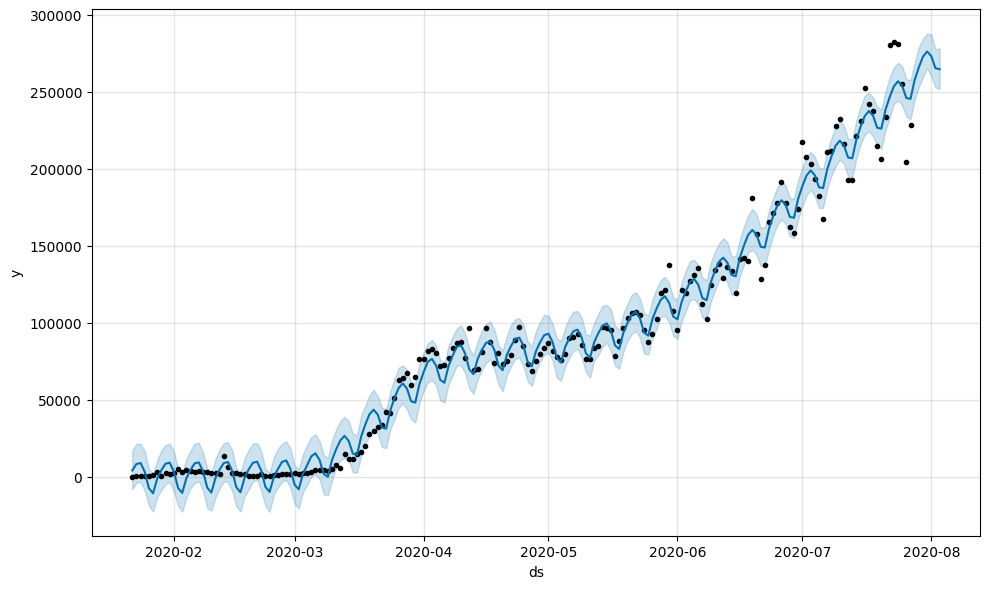

In [133]:
fig1 = model_cases.plot(forecast_cases)

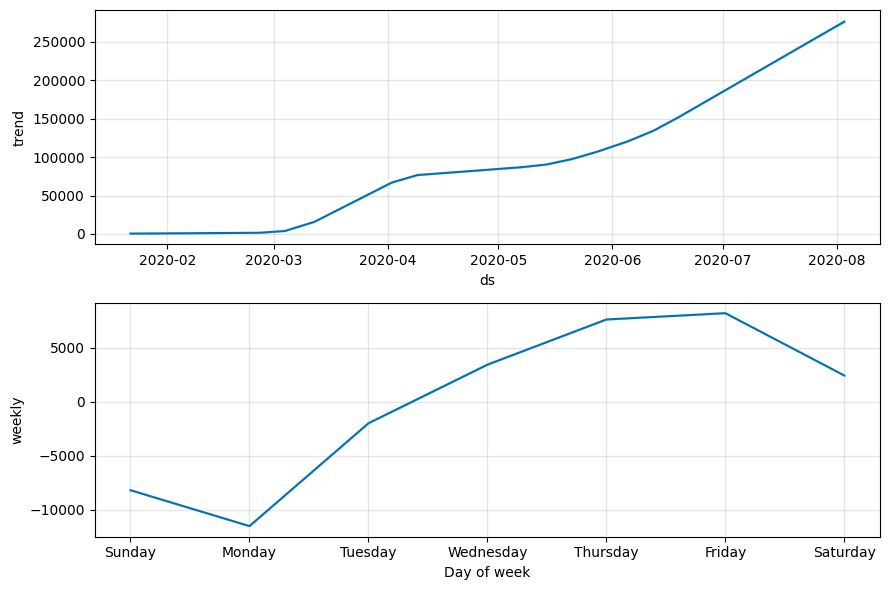

In [134]:
fig2 = model_cases.plot_components(forecast_cases)

In [135]:
def plot_forecast(cases, forecast_cases, metric='New cases', title='Prophet Forecast'):
    plt.figure(figsize=(12, 6))

    # Actual data
    plt.plot(cases['ds'], cases['y'], label=f'Actual {metric}')

    # Forecasted data for entire period
    plt.plot(forecast_cases['ds'], forecast_cases['yhat'], label=f'Predicted {metric}')

    # Highlight only the future section
    future_mask = forecast_cases['ds'] > cases['ds'].max()
    plt.plot(
        forecast_cases['ds'][future_mask],
        forecast_cases['yhat'][future_mask],
        'r--', label='Future Prediction'
    )

    plt.xlabel("Date")
    plt.ylabel("New Cases")
    plt.title(f"{title} - Actual vs Predicted {metric} (Prophet Model)")
    plt.legend()
    plt.grid(True)
    plt.show()


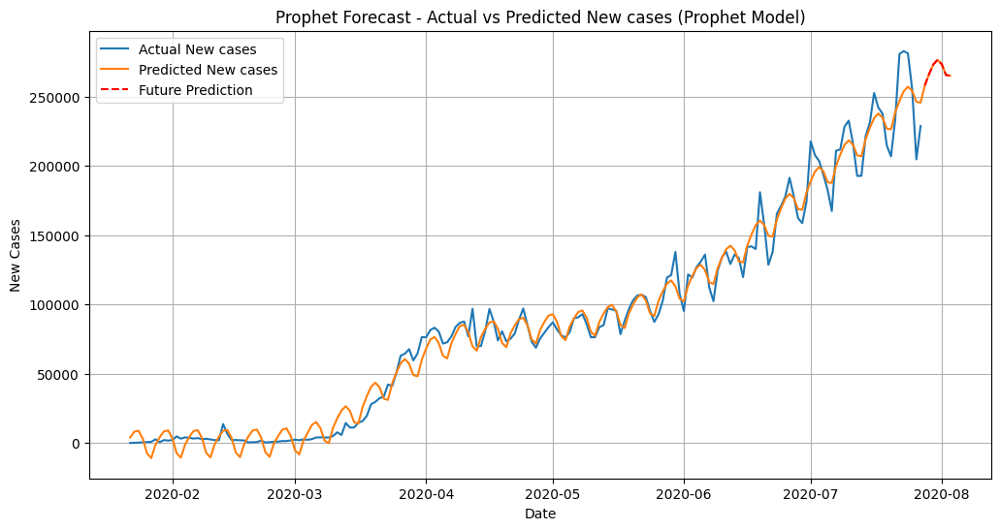

In [136]:
plot_forecast(cases, forecast_cases)

In [137]:
def plot_forecast_interactive(df, forecast, metric='New cases', title='Prophet Forecast'):
    # df: original with columns ds,y
    # forecast: prophet predict df with ds,yhat,yhat_lower,yhat_upper
    fig = go.Figure()

    # historical
    fig.add_trace(go.Scatter(
        x=df['ds'],
        y=df['y'],
        mode='lines+markers',
        name='Historical',
        line=dict(color='black', width=2),
        hovertemplate='%{x}<br>'+metric+': %{y}<extra></extra>'
    ))

    # forecast median
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat'],
        mode='lines',
        name='Forecast',
        line=dict(color='royalblue', width=2)
    ))

    # uncertainty band
    fig.add_trace(go.Scatter(
        x=pd.concat([forecast['ds'], forecast['ds'][::-1]]),
        y=pd.concat([forecast['yhat_upper'], forecast['yhat_lower'][::-1]]),
        fill='toself',
        fillcolor='rgba(65,105,225,0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo='skip',
        showlegend=True,
        name='Confidence Interval'
    ))

    fig.update_layout(
        title=title,
        xaxis_title='Date',
        yaxis_title=metric,
        hovermode='x unified'
    )

    fig.show()

In [138]:
plot_forecast_interactive(cases, forecast_cases, metric='New cases', title='Global New cases Forecast (7 days)')

In [139]:
cases_india = full_grouped[full_grouped['Country/Region']=='India'][['Date','New cases']].rename(columns={'Date':'ds','New cases':'y'})
cases_india['floor'] = 0

model_cases_india = Prophet(changepoint_prior_scale=0.1,
    changepoint_range = 0.95
)

model_cases_india.fit(cases_india)
future_cases_india = model_cases_india.make_future_dataframe(periods=7)
future_cases_india['floor'] = 0

forecast_cases_india = model_cases_india.predict(future_cases_india)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [140]:
forecast_cases_india['ds'].max().date() - overall_maximum_date

datetime.timedelta(days=7)

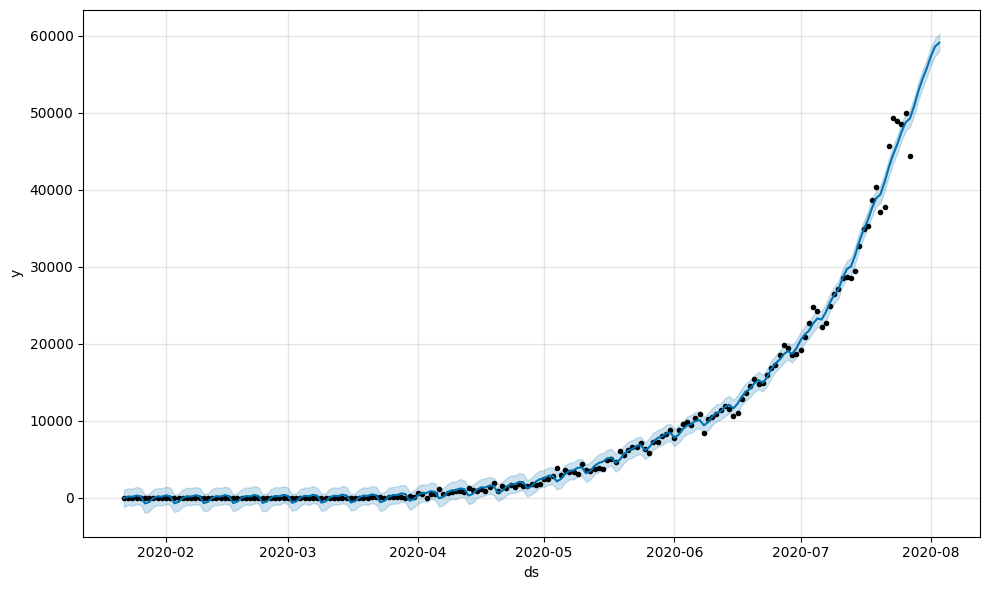

In [141]:
fig1_india = model_cases_india.plot(forecast_cases_india)

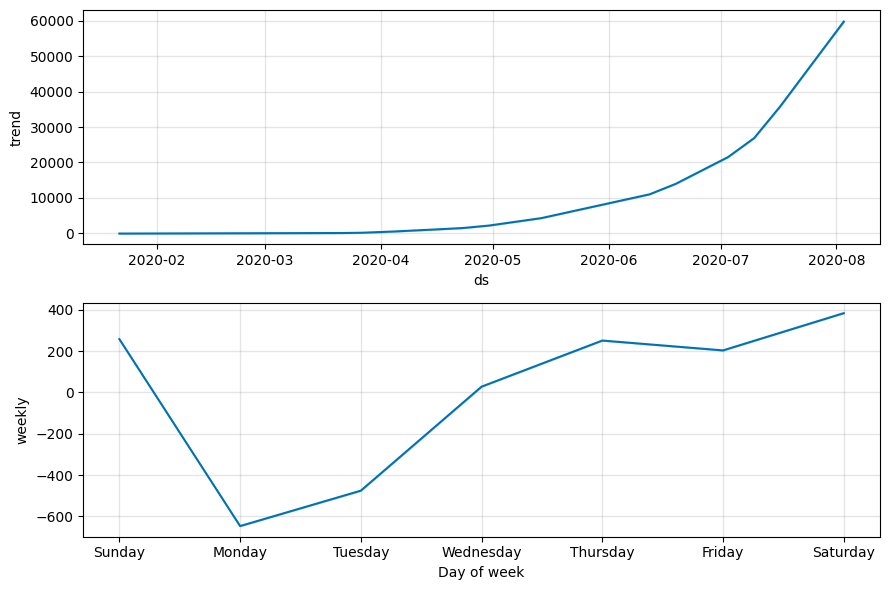

In [142]:
fig2_india = model_cases_india.plot_components(forecast_cases_india)

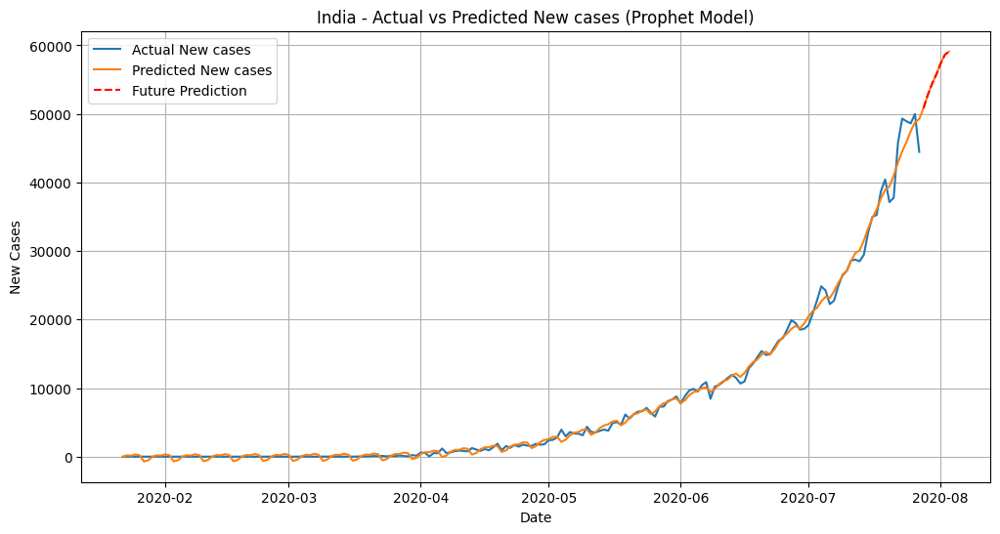

In [143]:
plot_forecast(cases_india, forecast_cases_india, title="India")

In [144]:
plot_forecast_interactive(cases, forecast_cases, metric='New cases', title='India New cases Forecast (7 days)')

In [145]:
def create_lag_feature(df, column, lag, horizon=7):
    if lag < horizon:
        raise ValueError(f"Lag must be >= horizon. Provided lag={lag}, horizon={horizon}")

    df_lag = df[['ds', column]].copy()
    last_date = df_lag['ds'].max()
    future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=horizon)
    df_future = pd.DataFrame({'ds': future_dates, column: None})

    df_ext = pd.concat([df_lag, df_future], ignore_index=True)
    df_ext[column] = df_ext[column].shift(lag)
    df_ext.fillna(0, inplace=True)
    return df_ext

In [146]:
def prophet_forecast(df, target_col, regressor_cols={}, horizon=7):
    df = df.rename(columns={'Date': 'ds', target_col : 'y'}) # rename without inplace creates a new df, original unchanged
    df['floor'] = 0

    # Create lagged feature
    for col_dict in regressor_cols:
        col_dict['lagged_df'] = create_lag_feature(df, col_dict['name'], col_dict['lag'], horizon)
        df = df.drop(col_dict['name'], axis=1) # since we already used that and it will conflict in merge
        df = df.merge(col_dict['lagged_df'], on='ds', how='left')

    # Fit model
    model = Prophet()
    for col_dict in regressor_cols:
        model.add_regressor(col_dict['name'])
    model.fit(df)

    # Future dates
    future_df = model.make_future_dataframe(periods=horizon)
    future_df['floor'] = 0
    for col_dict in regressor_cols:
        future_df = future_df.merge(col_dict['lagged_df'], on='ds', how='left')

    # Predict
    forecast = model.predict(future_df)

    return model, forecast

In [147]:
def prophet_forecast_with_more_changepoints(df, target_col, regressor_cols={}, horizon=7):
    df = df.rename(columns={'Date': 'ds', target_col : 'y'}) # rename without inplace creates a new df, original unchanged
    df['floor'] = 0

    # Create lagged feature
    for col_dict in regressor_cols:
        col_dict['lagged_df'] = create_lag_feature(df, col_dict['name'], col_dict['lag'], horizon)
        df = df.drop(col_dict['name'], axis=1) # since we already used that and it will conflict in merge
        df = df.merge(col_dict['lagged_df'], on='ds', how='left')

    # Fit model
    model = Prophet(changepoint_prior_scale=0.5, changepoint_range=0.95)
    for col_dict in regressor_cols:
        model.add_regressor(col_dict['name'])
    model.fit(df)

    # Future dates
    future_df = model.make_future_dataframe(periods=horizon)
    future_df['floor'] = 0
    for col_dict in regressor_cols:
        future_df = future_df.merge(col_dict['lagged_df'], on='ds', how='left')

    # Predict
    forecast = model.predict(future_df)

    return model, forecast

In [148]:
regressors_for_recovered = [
    {
        'name' : 'New cases',
        'lag' : 15
    }
]

In [149]:
regressors_for_deaths= [
    {
        'name' : 'New cases',
        'lag' : 18
    },
    {
        'name' : 'New recovered',
        'lag' : 7
    }
]

In [150]:
forecast_model_recovered, forecast_recovered = prophet_forecast_with_more_changepoints(
    day_wise, target_col='New recovered', regressor_cols=regressors_for_recovered
    )

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [151]:
forecast_model_recovered.extra_regressors

OrderedDict([('New cases',
              {'prior_scale': 10.0,
               'standardize': 'auto',
               'mu': 68803.09042553192,
               'std': 63727.4582244666,
               'mode': 'additive'})])

In [152]:
print(forecast_model_recovered.params)

OrderedDict({'lp__': array([[431.71662]]), 'k': array([[0.05156376]]), 'm': array([[0.04463634]]), 'delta': array([[ 7.1392722e-08, -7.3045235e-08,  2.0722550e-07,  2.2359972e-07,
         2.8306295e-08,  4.8634742e-07,  7.4105808e-02,  9.1974266e-02,
         2.8342819e-06,  1.1378787e-07,  3.3224450e-07,  4.6749635e-02,
         1.2363960e-01,  9.1818012e-02,  1.7822207e-01,  8.9694627e-02,
         2.2107296e-07, -2.6257042e-08,  3.4837745e-03,  1.2588970e-01,
         2.0202896e-01,  5.9153612e-07, -2.4729989e-06,  1.1837701e-08,
         5.6960675e-06]]), 'sigma_obs': array([[0.06036052]]), 'beta': array([[-0.00694107,  0.01715808,  0.00723031, -0.0082504 , -0.01143337,
         0.00471301,  0.04504464]]), 'trend': array([[0.04463634, 0.04491208, 0.04518783, 0.04546357, 0.04573931,
        0.04601505, 0.0462908 , 0.04656654, 0.04684228, 0.04711802,
        0.04739376, 0.04766951, 0.04794525, 0.04822099, 0.04849673,
        0.04877248, 0.04904822, 0.04932396, 0.0495997 , 0.04987544

In [153]:
print("Changepoints:")
print(forecast_model_recovered.changepoints)

print("Changepoint Prior Scale:", forecast_model_recovered.changepoint_prior_scale)
print("Detected Changepoints in Time:")
print(forecast_model_recovered.params['delta'].shape)


Changepoints:
7     2020-01-29
14    2020-02-05
21    2020-02-12
28    2020-02-19
35    2020-02-26
42    2020-03-04
50    2020-03-12
57    2020-03-19
64    2020-03-26
71    2020-04-02
78    2020-04-09
85    2020-04-16
92    2020-04-23
99    2020-04-30
106   2020-05-07
113   2020-05-14
120   2020-05-21
127   2020-05-28
135   2020-06-05
142   2020-06-12
149   2020-06-19
156   2020-06-26
163   2020-07-03
170   2020-07-10
177   2020-07-17
Name: ds, dtype: datetime64[ns]
Changepoint Prior Scale: 0.5
Detected Changepoints in Time:
(1, 25)


In [154]:
forecast_recovered

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,New cases,New cases_lower,New cases_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,extra_regressors_additive_lower,extra_regressors_additive_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22,12694.308131,-18555.676303,23239.200299,12694.308131,12694.308131,-13830.722879,-13830.722879,-13830.722879,-10524.367490,-10524.367490,-10524.367490,-13830.722879,-13830.722879,-13830.722879,3306.355389,3306.355389,3306.355389,0.0,0.0,0.0,2169.940641
1,2020-01-23,12772.727512,-17270.958947,24703.155131,12772.727512,12772.727512,-13830.722879,-13830.722879,-13830.722879,-9957.080310,-9957.080310,-9957.080310,-13830.722879,-13830.722879,-13830.722879,3873.642569,3873.642569,3873.642569,0.0,0.0,0.0,2815.647202
2,2020-01-24,12851.146893,-22015.868994,21346.254716,12851.146893,12851.146893,-13830.722879,-13830.722879,-13830.722879,-12423.249222,-12423.249222,-12423.249222,-13830.722879,-13830.722879,-13830.722879,1407.473657,1407.473657,1407.473657,0.0,0.0,0.0,427.897672
3,2020-01-25,12929.566274,-21871.231277,22491.777429,12929.566274,12929.566274,-13830.722879,-13830.722879,-13830.722879,-12241.347516,-12241.347516,-12241.347516,-13830.722879,-13830.722879,-13830.722879,1589.375363,1589.375363,1589.375363,0.0,0.0,0.0,688.218758
4,2020-01-26,13007.985655,-34957.693676,8054.456417,13007.985655,13007.985655,-13830.722879,-13830.722879,-13830.722879,-25622.521142,-25622.521142,-25622.521142,-13830.722879,-13830.722879,-13830.722879,-11791.798263,-11791.798263,-11791.798263,0.0,0.0,0.0,-12614.535487
5,2020-01-27,13086.405036,-23822.219631,19242.201613,13086.405036,13086.405036,-13830.722879,-13830.722879,-13830.722879,-14354.137025,-14354.137025,-14354.137025,-13830.722879,-13830.722879,-13830.722879,-523.414146,-523.414146,-523.414146,0.0,0.0,0.0,-1267.731989
6,2020-01-28,13164.824417,-21476.157911,23272.888397,13164.824417,13164.824417,-13830.722879,-13830.722879,-13830.722879,-11692.357448,-11692.357448,-11692.357448,-13830.722879,-13830.722879,-13830.722879,2138.365431,2138.365431,2138.365431,0.0,0.0,0.0,1472.466969
7,2020-01-29,13243.243798,-20116.192943,24960.785993,13243.243798,13243.243798,-13830.722879,-13830.722879,-13830.722879,-10524.367490,-10524.367490,-10524.367490,-13830.722879,-13830.722879,-13830.722879,3306.355389,3306.355389,3306.355389,0.0,0.0,0.0,2718.876308
8,2020-01-30,13321.663288,-19247.820940,26088.893593,13321.663288,13321.663288,-13830.722879,-13830.722879,-13830.722879,-9957.080310,-9957.080310,-9957.080310,-13830.722879,-13830.722879,-13830.722879,3873.642569,3873.642569,3873.642569,0.0,0.0,0.0,3364.582977
9,2020-01-31,13400.082777,-22117.491542,21511.046941,13400.082777,13400.082777,-13830.722879,-13830.722879,-13830.722879,-12423.249222,-12423.249222,-12423.249222,-13830.722879,-13830.722879,-13830.722879,1407.473657,1407.473657,1407.473657,0.0,0.0,0.0,976.833556


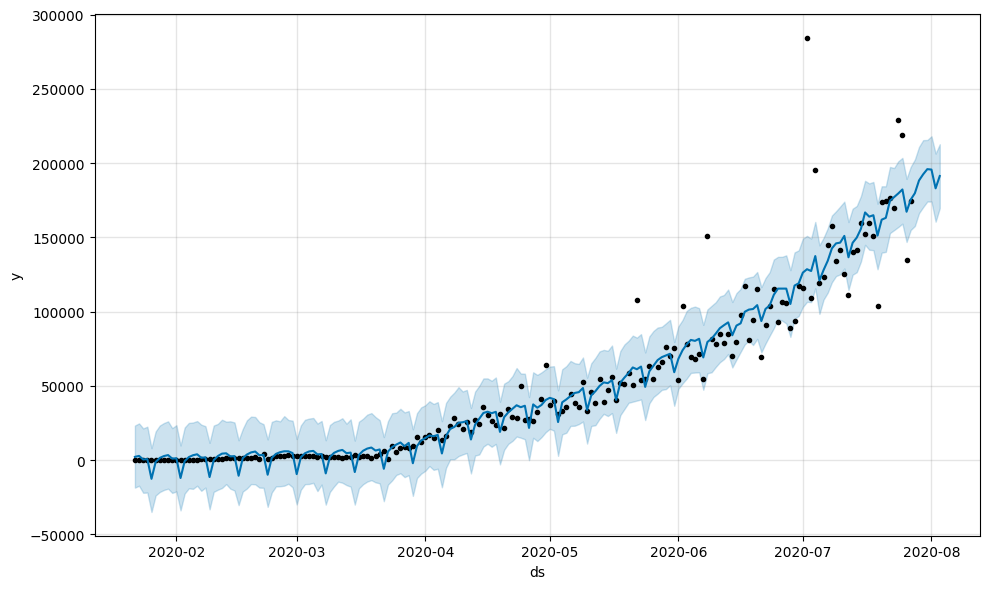

In [155]:
fig1_recovered = forecast_model_recovered.plot(forecast_recovered)

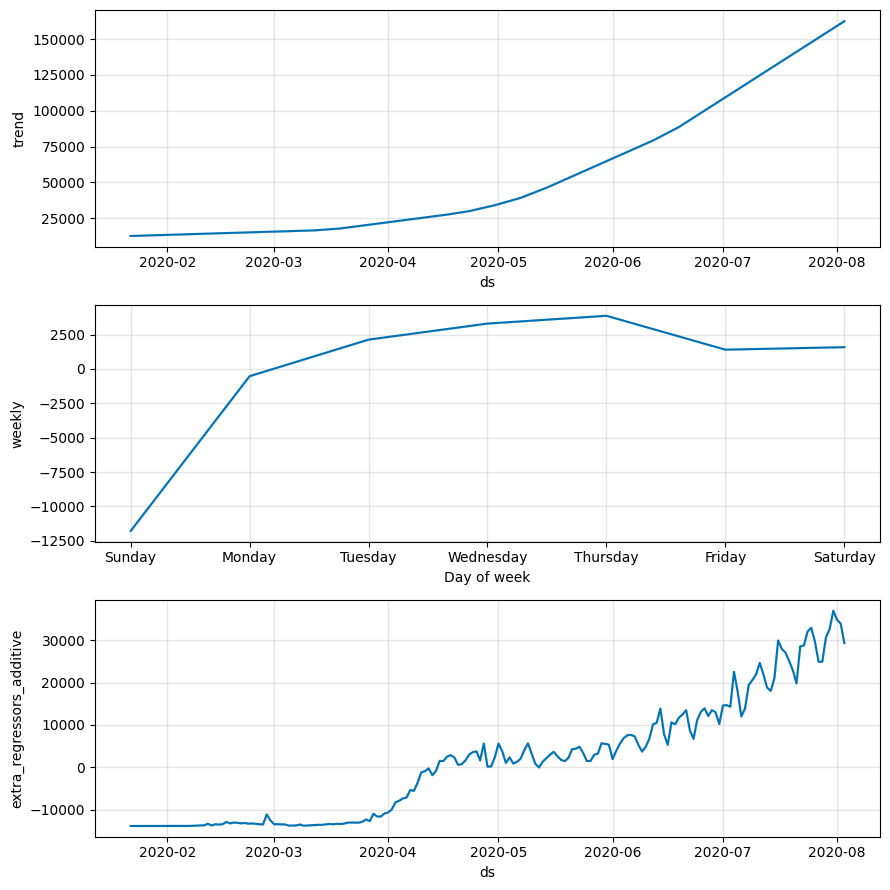

In [156]:
fig2_recovered = forecast_model_recovered.plot_components(forecast_recovered)

In [157]:
forecast_model_deaths, forecast_deaths = prophet_forecast_with_more_changepoints(day_wise, target_col='New deaths', regressor_cols=regressors_for_deaths)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [158]:
forecast_model_deaths.extra_regressors

OrderedDict([('New cases',
              {'prior_scale': 10.0,
               'standardize': 'auto',
               'mu': 65390.46808510638,
               'std': 61510.682147583204,
               'mode': 'additive'}),
             ('New recovered',
              {'prior_scale': 10.0,
               'standardize': 'auto',
               'mu': 43785.436170212764,
               'std': 50413.87413103308,
               'mode': 'additive'})])

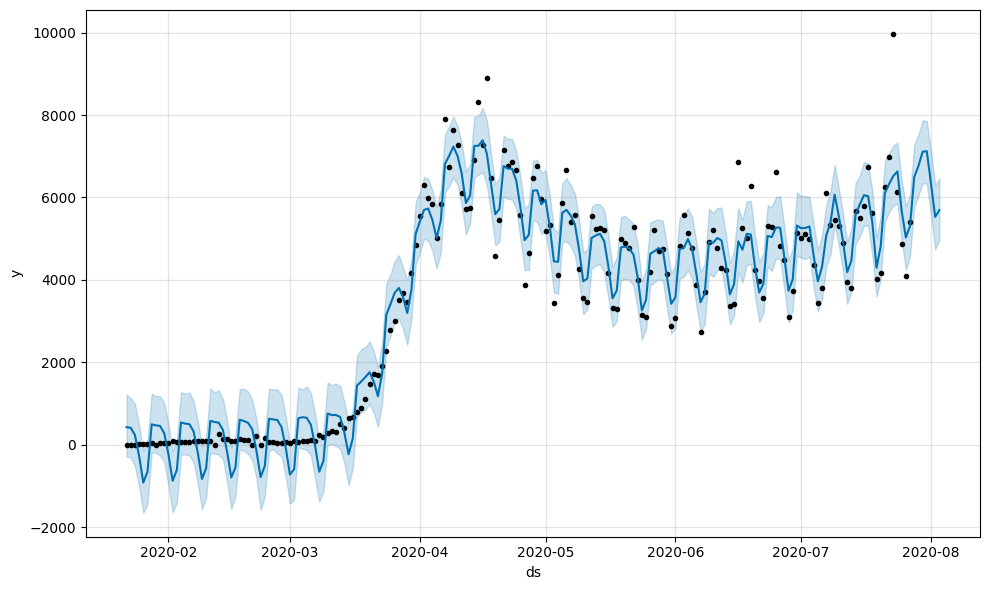

In [159]:
fig1_deaths = forecast_model_deaths.plot(forecast_deaths)

In [160]:
(cleaned_df['Active'] == (cleaned_df['Confirmed'] - cleaned_df['Recovered'] - cleaned_df['Deaths'])).all()

np.True_

In [161]:
(cleaned_df['Active']).equals(cleaned_df['Confirmed'] - cleaned_df['Recovered'] - cleaned_df['Deaths'])

True

In [162]:
forecast_model_cases, forecast_cases_30 = prophet_forecast_with_more_changepoints(day_wise, target_col='New cases', horizon=30)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


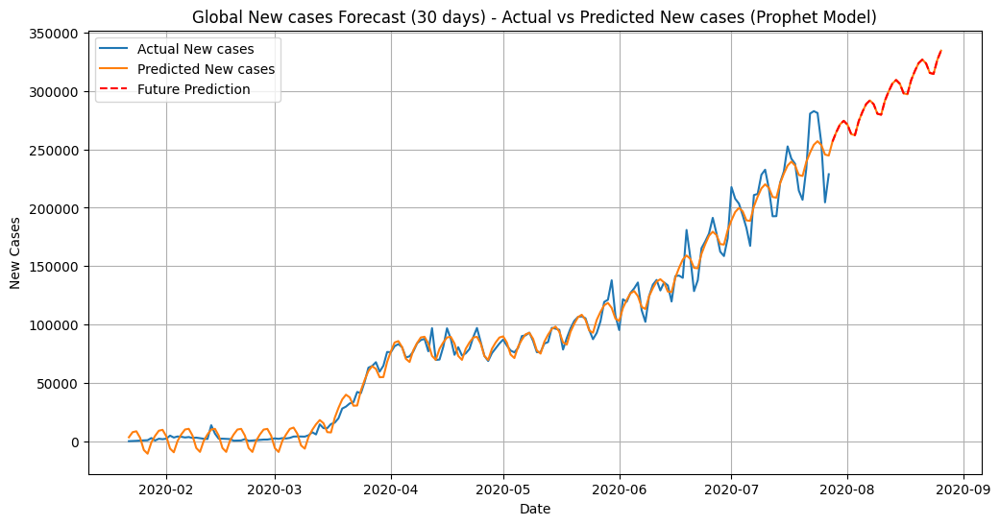

In [163]:
plot_forecast(
        day_wise.copy().rename(columns={'Date' : 'ds', 'New cases' : 'y'}),
        forecast_cases_30, title='Global New cases Forecast (30 days)'
        )


In [164]:
plot_forecast_interactive(
    day_wise.copy().rename(columns={'Date' : 'ds', 'New cases' : 'y'}),
    forecast_cases_30,
    title='Global New cases Forecast (30 days)'
    )

In [165]:
day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory 

In [166]:
set(day_wise.columns).intersection(full_grouped.columns)

{'Active',
 'Confirmed',
 'Date',
 'Deaths',
 'New cases',
 'New deaths',
 'New recovered',
 'Recovered'}

In [167]:
set(full_grouped.columns) - set(day_wise.columns)

{'Country/Region', 'Lat', 'Long', 'WHO Region'}

In [168]:
set(day_wise.columns) - set(full_grouped.columns)

{'Deaths / 100 Cases',
 'Deaths / 100 Recovered',
 'No. of countries',
 'Recovered / 100 Cases'}

In [169]:
def predict_df(df, horizon=7):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])
    predicted_df = pd.DataFrame()
    predicted_df['Date'] = pd.date_range(
        start=df['Date'].min().date(), end=df['Date'].max().date() + pd.Timedelta(days= horizon), freq='D'
        )

    model_cases, forecast_cases = prophet_forecast(df, 'New cases', horizon=horizon)
    model_recovered, forecast_recovered = prophet_forecast(
        df, 'New recovered', regressor_cols=regressors_for_recovered ,horizon=horizon
        )
    model_deaths, forecast_deaths = prophet_forecast(
        df, 'New deaths', regressor_cols=regressors_for_deaths ,horizon=horizon
        )

    predicted_df['New cases'] = forecast_cases['yhat']
    predicted_df['New recovered'] = forecast_recovered['yhat']
    predicted_df['New deaths'] = forecast_deaths['yhat']

    predicted_numbers = ['New cases', 'New deaths', 'New recovered']
    predicted_df[predicted_numbers] = predicted_df[predicted_numbers].applymap(lambda x: max(0, np.floor(x))).astype('int64')

    predicted_df['New cases'] = predicted_df['New cases'].apply(lambda x: 0 if x<0 else x)
    predicted_df['New deaths'] = predicted_df['New deaths'].apply(lambda x: 0 if x<0 else x)
    predicted_df['New recovered'] = predicted_df['New recovered'].apply(lambda x: 0 if x<0 else x)

    # the below 3 can never be negative after we made above 3 to 0 to +ve
    predicted_df['Confirmed'] = predicted_df['New cases'].cumsum()
    predicted_df['Recovered'] = predicted_df['New recovered'].cumsum()
    predicted_df['Deaths'] = predicted_df['New deaths'].cumsum()

    predicted_df['Active'] = predicted_df['Confirmed'] - predicted_df['Deaths'] - predicted_df['Recovered']
    predicted_df['Active'] = predicted_df['Active'].apply(lambda x: max(0, x)).astype('int64')

    predicted_df.fillna(0, inplace=True)
    predicted_df.fillna(0, inplace=True)
    predicted_df = predicted_df.astype({
        'New cases': 'int64',
        'New recovered': 'int64',
        'New deaths': 'int64',
        'Confirmed': 'int64',
        'Recovered': 'int64',
        'Deaths': 'int64',
        'Active': 'int64'
    })

    return predicted_df

In [170]:
def predict_day_wise(day_wise, horizon=7):

    predicted_day_wise = predict_df(day_wise, horizon=horizon)

    predicted_day_wise['Deaths / 100 Cases'] = round((predicted_day_wise['Deaths']/predicted_day_wise['Confirmed'])*100, 2)
    predicted_day_wise['Recovered / 100 Cases'] = round((predicted_day_wise['Recovered']/predicted_day_wise['Confirmed'])*100, 2)
    predicted_day_wise['Deaths / 100 Recovered'] = round((predicted_day_wise['Deaths']/predicted_day_wise['Recovered'])*100, 2)

    # if a ratio can't be arrived
    ratios = ['Deaths / 100 Cases', 'Recovered / 100 Cases', 'Deaths / 100 Recovered']
    predicted_day_wise[ratios] = predicted_day_wise[ratios].replace([float('inf'), -float('inf')], 0)
    predicted_day_wise.fillna(0, inplace=True) # all are number except Date. Date is never nan or none here

    ordered_columns = [col for col in day_wise.columns if col != 'No. of countries']
    predicted_day_wise = predicted_day_wise[ordered_columns]

    # SKIPPING No. of countries as we are not predicting country wise and daywise combine

    return predicted_day_wise

In [171]:
predicted_day_wise = predict_day_wise(day_wise)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [172]:
day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    188 non-null    datetime64[ns]
 1   Confirmed               188 non-null    int64         
 2   Deaths                  188 non-null    int64         
 3   Recovered               188 non-null    int64         
 4   Active                  188 non-null    int64         
 5   New cases               188 non-null    int64         
 6   New deaths              188 non-null    int64         
 7   New recovered           188 non-null    int64         
 8   Deaths / 100 Cases      188 non-null    float64       
 9   Recovered / 100 Cases   188 non-null    float64       
 10  Deaths / 100 Recovered  188 non-null    float64       
 11  No. of countries        188 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(8)
memory 

In [173]:
day_wise.columns

Index(['Date', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'New cases',
       'New deaths', 'New recovered', 'Deaths / 100 Cases',
       'Recovered / 100 Cases', 'Deaths / 100 Recovered', 'No. of countries'],
      dtype='object')

In [174]:
predicted_day_wise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    195 non-null    datetime64[ns]
 1   Confirmed               195 non-null    int64         
 2   Deaths                  195 non-null    int64         
 3   Recovered               195 non-null    int64         
 4   Active                  195 non-null    int64         
 5   New cases               195 non-null    int64         
 6   New deaths              195 non-null    int64         
 7   New recovered           195 non-null    int64         
 8   Deaths / 100 Cases      195 non-null    float64       
 9   Recovered / 100 Cases   195 non-null    float64       
 10  Deaths / 100 Recovered  195 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(7)
memory usage: 16.9 KB


In [175]:
predicted_day_wise.isnull().sum().sum()

np.int64(0)

In [176]:
predicted_day_wise.duplicated().sum()

np.int64(0)

In [177]:
plot_trend(predicted_day_wise)

In [178]:
plot_trend(predicted_day_wise, metrics=['New cases', 'New recovered', 'New deaths'])

In [179]:
full_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            35156 non-null  datetime64[ns]
 1   Country/Region  35156 non-null  object        
 2   Lat             35156 non-null  float64       
 3   Long            35156 non-null  float64       
 4   Confirmed       35156 non-null  int64         
 5   Deaths          35156 non-null  int64         
 6   Recovered       35156 non-null  int64         
 7   Active          35156 non-null  int64         
 8   New cases       35156 non-null  int64         
 9   New deaths      35156 non-null  int64         
 10  New recovered   35156 non-null  int64         
 11  WHO Region      35156 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(7), object(2)
memory usage: 3.2+ MB


In [180]:
def predict_full_grouped(full_grouped, horizon=7):

    countries = full_grouped['Country/Region'].unique()
    predicted_full_grouped = pd.DataFrame(columns=full_grouped.columns)
    # explicitly setting the dtypes based on the original
    predicted_full_grouped = predicted_full_grouped.astype(full_grouped.dtypes.to_dict())

    for country in countries:
        country_df = full_grouped[full_grouped['Country/Region'] == country]
        predicted_country_df = predict_df(country_df, horizon=horizon)
        predicted_country_df['Country/Region'] = country

        # each country has same value columns of the below for all rows
        predicted_country_df['Lat'] = country_df['Lat'].iloc[0]
        predicted_country_df['Long'] = country_df['Long'].iloc[0]
        predicted_country_df['WHO Region'] = country_df['WHO Region'].iloc[0]

        # no need to fillna because it is already filled in predict_df and other cols can't be null
        predicted_full_grouped = pd.concat([predicted_full_grouped, predicted_country_df], ignore_index=True)

    predicted_full_grouped.sort_values(by=['Country/Region', 'Date'], inplace=True)

    return predicted_full_grouped

In [181]:
predicted_full_grouped = predict_full_grouped(full_grouped)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

In [182]:
predicted_full_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36465 entries, 0 to 36464
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            36465 non-null  datetime64[ns]
 1   Country/Region  36465 non-null  object        
 2   Lat             36465 non-null  float64       
 3   Long            36465 non-null  float64       
 4   Confirmed       36465 non-null  int64         
 5   Deaths          36465 non-null  int64         
 6   Recovered       36465 non-null  int64         
 7   Active          36465 non-null  int64         
 8   New cases       36465 non-null  int64         
 9   New deaths      36465 non-null  int64         
 10  New recovered   36465 non-null  int64         
 11  WHO Region      36465 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(7), object(2)
memory usage: 3.3+ MB


In [183]:
predicted_full_grouped.columns.equals(full_grouped.columns)

True

In [184]:
predicted_full_grouped.dtypes.equals(full_grouped.dtypes)

True

In [185]:
predicted_full_grouped.isnull().sum().sum()

np.int64(0)

In [186]:
predicted_full_grouped.duplicated().sum()

np.int64(0)

In [187]:
plot_country_trend(predicted_full_grouped, ['India', 'US', 'United Kingdom'], metrics=['Confirmed'])

In [188]:
plot_country_trend(predicted_full_grouped, ['France', 'United Kingdom'], metrics=['Confirmed'])

In [189]:
plot_country_trend(predicted_full_grouped, ['India', 'US', 'United Kingdom'], metrics=['Active'])

In [190]:
plot_world_bubble_map(predicted_full_grouped, animation_frame='Date', title='Predicted COVID-19 Spread Over Time (Animated Bubble Map)')

In [191]:
plot_world_bubble_map(predicted_full_grouped, animation_frame='Date', size_col='New deaths' ,title='Predicted COVID-19 New deaths Over Time (Animated Bubble Map)')

In [192]:
# Predicted Confirmation Distribution
plot_choropleth(predicted_full_grouped, animation_frame='Date')

In [193]:
# default metric is Confirmed
plot_animated_bar_race(predicted_full_grouped, title='Predicted COVID-19 Top Countries Over Time (Animated Bar Race)')

#### Save the predictions

In [194]:
predicted_day_wise.to_csv('predicted_day_wise.csv', index=False)

In [195]:
predicted_full_grouped.to_csv('predicted_full_grouped.csv', index=False)

#### Possible Improvements

Predicted Full grouped can be further verified for Confirmed is always sum of Active, recovered and deaths.

And then using the code in Covid_19_Data_Extraction.ipynb file the Predicted Full grouped can be made into Predicted day wise (fully with No. of countries) and then Predicted country wise latest

These can be used in many visualisation in this file